<p align="center"><img src="https://github.com/akshxyjagtap/Data-Science/blob/main/NETFLIX/images/netflix%20logo%20.png?raw=true" width="260" height="110" /></p>

# NETFLIX MOVIES AND TV SHOWS EDA

---
# **Table of Contents**
---

1. [**About Netflix**](#Section1)<br>
2. [**About Project**](#Section2)<br>
3. [**Problem Statement**](#Section3)<br>
4. [**Importing Libraries**](#Section4)<br>
5. [**Data Acquisition & Description**](#Section5)<br>
6. [**Data Preprocessing**](#Section6)<br>
7. [**Data Cleaning & Filling**](#Section7)<br>
8. [**Exploratory Data Analysis**](#Section8)<br>
9. [**Summarization,Conclusion &Actionable Insights**](#Section9)</br>

---
<a name = Section1></a>
## About Netflix
---
-  Netflix, Inc. is an American over-the-top media service and original programming production company. It offers subscription-    based video on demand from a library of films and television series, 40% of which is Netflix original programming produced      in-house. Netflix has also played a prominent role in independent film distribution. As of July 2021,
   Netflix had 209      million  subscribers, including 72 million in the United States and Canada.
- The company is ranked 164th on the Fortune 500 and 284th on the Forbes Global 2000. It is the largest entertainment/media       company by market capitalization.  In 2021, Netflix was ranked as the 8th most trusted brand globally by Morning Consult.
  During the 2010s decade, Netflix was the top-performing stock in the S&P 500 stock market index.

---
<a name = Section2></a>
## About Project
---
- Exploratory data analysis on **NETFLIX MOVIES AND TV SHOWS**
- EDA done using python, numpy, pandas, matplotlib, seaborn and plotly.
- You will find many usefull visualisations and interactive dashboards in the project.
- I have tried to analyse  most of the features of the dataset to  derive insights.
- Dataset -  netflix_titles from  kaggle -  [link](https://www.kaggle.com/shivamb/netflix-shows) .

---
<a name = Section3></a>
## Probelm statement
---
- Understanding what content is available in different countries
- Identifying similar content by matching text-based features
- Network analysis of Actors / Directors and find interesting insights
- Does Netflix has more focus on TV Shows than movies in recent years.

---
<a name = Section4></a>
## Importing libraries
---
- importing the necessary libraries that will be required.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statistics as stat
import plotly.express as px

%matplotlib inline

import seaborn as sns
sns.set(style='darkgrid', font_scale=1.2, color_codes=True)

import warnings
warnings.filterwarnings('ignore')


---
<a name = Section5></a>
## Data Acquisition & Description
---

In [2]:
raw_data = pd.read_csv("https://github.com/akshxyjagtap/Data-Science/blob/3b4a8738704991d3a25c01590f570862a1ad050e/NETFLIX/dataset/netflix_titles.csv?raw=true")

In [3]:
raw_data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [4]:
raw_data.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


---
<a name = Section6></a>
## DATA PREPROCESSING
---

-- converting date to formatted date 

In [5]:
raw_data["date_added"] = pd.to_datetime(raw_data['date_added'])
raw_data['year_added'] = raw_data['date_added'].dt.year
raw_data.shape

(7787, 13)

In [6]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7787 non-null   object        
 1   type          7787 non-null   object        
 2   title         7787 non-null   object        
 3   director      5398 non-null   object        
 4   cast          7069 non-null   object        
 5   country       7280 non-null   object        
 6   date_added    7777 non-null   datetime64[ns]
 7   release_year  7787 non-null   int64         
 8   rating        7780 non-null   object        
 9   duration      7787 non-null   object        
 10  listed_in     7787 non-null   object        
 11  description   7787 non-null   object        
 12  year_added    7777 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(10)
memory usage: 791.0+ KB


In [7]:
raw_data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'year_added'],
      dtype='object')

In [8]:
raw_data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
year_added        10
dtype: int64

---
<a name = Section7></a>
## Data Cleaning & Filling 
---
- filling nan values with their respective mode values
- i have filled nan director values with DNK i,e director not known as i cannot remove too much data
   in order to clean it
- dropped description and date_added .

In [9]:
missing = raw_data.isnull().sum().to_frame()

<AxesSubplot:title={'center':'Missing Values'}>

<Figure size 720x504 with 0 Axes>

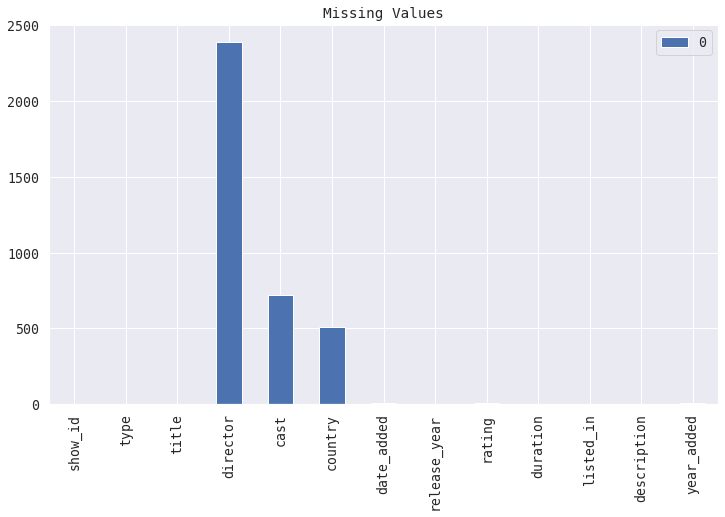

In [10]:
plt.figure(figsize = (10, 7))
font = {'family' : 'monospace',
        'weight' : 'normal',
        'size'   : '22'}
plt.rc('font', **font)
missing.plot( title="Missing Values", figsize=(12,7), kind="bar")

In [11]:
 (raw_data.country).mode()

0    United States
dtype: object

In [12]:
raw_data.year_added.mode()

0    2019.0
dtype: float64

In [13]:
raw_data['rating'] = raw_data['rating'].fillna('TV-MA')
raw_data['country'] = raw_data['country'].fillna('United States')
raw_data['year_added'] = raw_data['year_added'].fillna(2019)
raw_data['director'] = raw_data['director'].fillna('DNK')


In [14]:
raw_data.drop(['date_added'],axis=1,inplace=True)
raw_data.drop([ 'description'], axis=1, inplace=True)
raw_data.dropna(subset =['cast'],inplace=True)

In [15]:
raw_data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
release_year    0
rating          0
duration        0
listed_in       0
year_added      0
dtype: int64

In [16]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7069 entries, 0 to 7785
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   show_id       7069 non-null   object 
 1   type          7069 non-null   object 
 2   title         7069 non-null   object 
 3   director      7069 non-null   object 
 4   cast          7069 non-null   object 
 5   country       7069 non-null   object 
 6   release_year  7069 non-null   int64  
 7   rating        7069 non-null   object 
 8   duration      7069 non-null   object 
 9   listed_in     7069 non-null   object 
 10  year_added    7069 non-null   float64
dtypes: float64(1), int64(1), object(9)
memory usage: 662.7+ KB


In [17]:
df = raw_data.reset_index()

---
<a name =Section8><a/>
# Exploratory Data Analysis
---

In [18]:
print(df['release_year'].min() , df['release_year'].max())

1942 2021


In [19]:
df_tv_show = df[df['type'] == 'TV Show']
df_movies = df[df['type'] == 'Movie']

In [20]:
font = {'family' : 'monospace',
        'weight' : 'normal',
        'size'   : '22'}
plt.rc( 'font',**font)

## Movies Vs Tv Shows

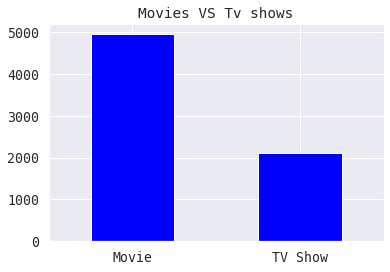

In [21]:
vs = df.type.value_counts()
vs.plot.bar(color  ="blue")
plt.xticks(rotation = 0)
plt.title("Movies VS Tv shows")
plt.show()


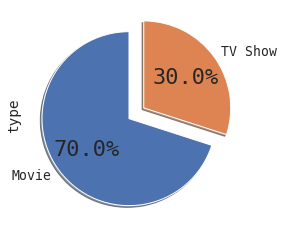

In [22]:
vs.plot.pie( autopct='%1.1f%%', shadow=True, startangle=90 , explode = (0.07,0.14) )
plt.show()

## COUNTRY & YEAR WISE ANALYSIS

In [23]:
df['country'] = df['country'].apply(lambda x: x.split(",")[0])

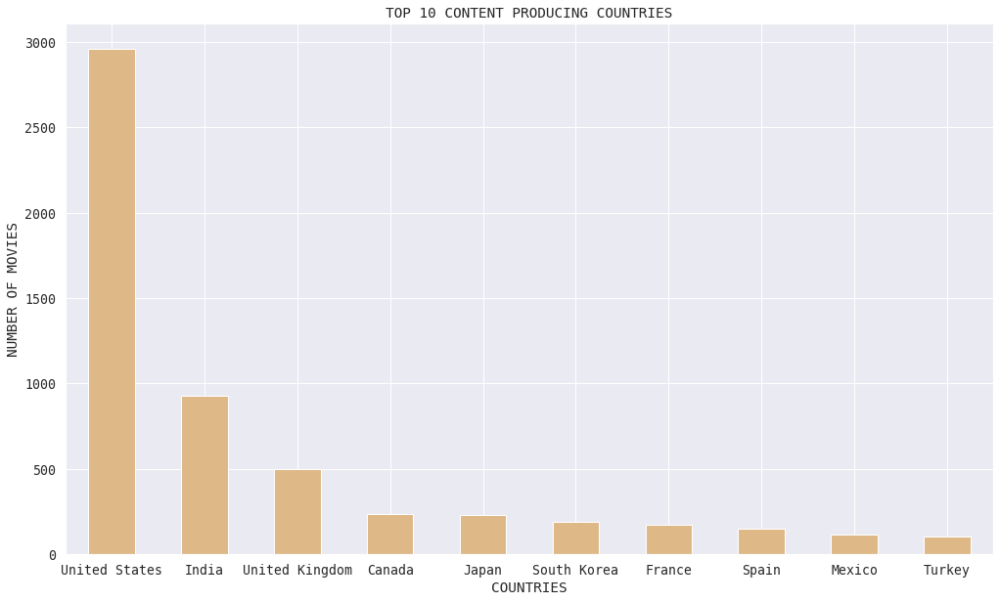

In [24]:
cont = df.country.value_counts().head(10)
plt.figure(figsize = (17, 10) )
cont.plot.bar(color = 'burlywood' )
plt.xticks(rotation = 0)
plt.xlabel("COUNTRIES")
plt.ylabel("NUMBER OF MOVIES")
plt.title("TOP 10 CONTENT PRODUCING COUNTRIES")
plt.show()

In [25]:
fig = px.treemap(df, path=[px.Constant('type'),'type','country','title'],   color='country')
fig.show()

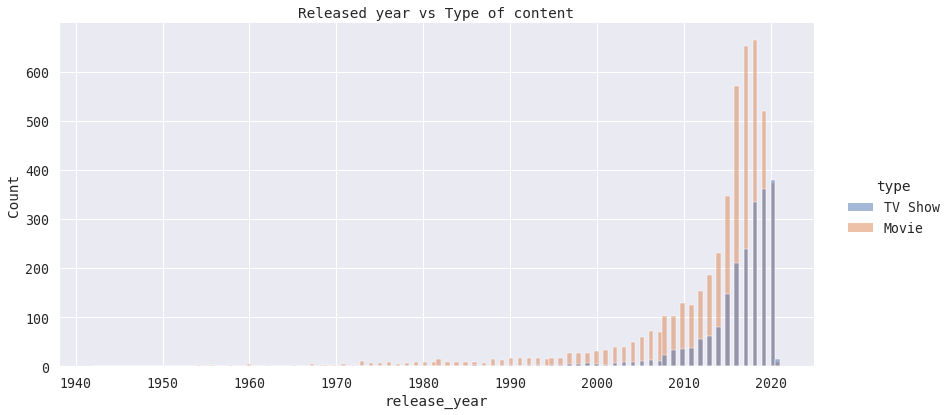

In [26]:
sns.displot(df,x='release_year',hue='type', height=6 ,  aspect=2)
plt.title('Released year vs Type of content')
plt.show()

In [27]:
# zoom in for more insights

In [28]:
fig = px.strip(df, x='release_year', y="type", orientation="h", color="type")
fig.show()

## CONTENT & RATING ANALYSIS
- I converted rating into more readable form by merging catogories and replacing them  to 'kids', 'teens' ,'adults'.

Text(18.620596296296313, 0.5, 'Count')

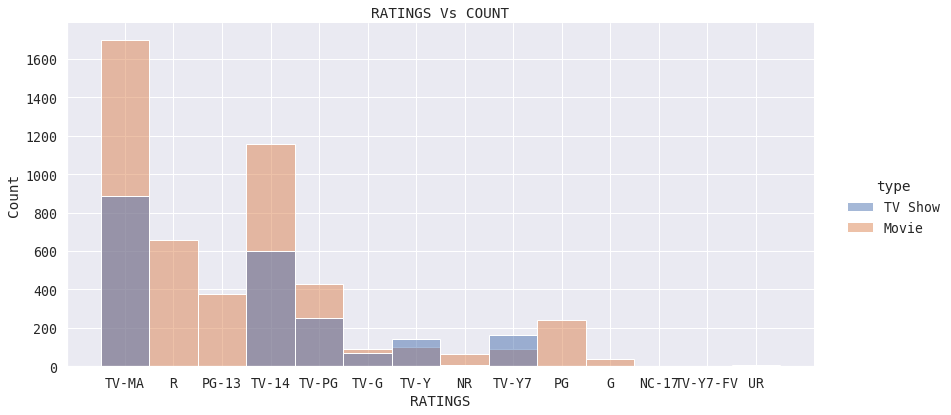

In [29]:
sns.displot(df,x='rating', hue ="type",height=6 ,  aspect=2  )
plt.title('RATINGS Vs COUNT')
plt.xlabel("RATINGS")
plt.ylabel("Count")

In [30]:
fig = px.treemap(df, path=['rating', 'type', 'title'  ],   color='type')
fig.show()

In [31]:
df['rating'] = df['rating'].replace({'TV-PG': 'Kids','TV-MA': 'Adults','TV-Y7-FV':'Kids','TV-Y7': 'Kids','TV-14': 'Teens','R': 'Adults',
                                         'TV-Y': 'Kids','NR': 'Adults','PG-13': 'Teens', 'TV-G': 'Kids', 
                                         'PG': 'Kids', 'G': 'Kids','UR': 'Adults',
                                         'NC-17': 'Adults'})

In [32]:
df.rating.value_counts()

Adults    3318
Teens     2136
Kids      1615
Name: rating, dtype: int64

Text(19.992715555555563, 0.5, 'COUNT')

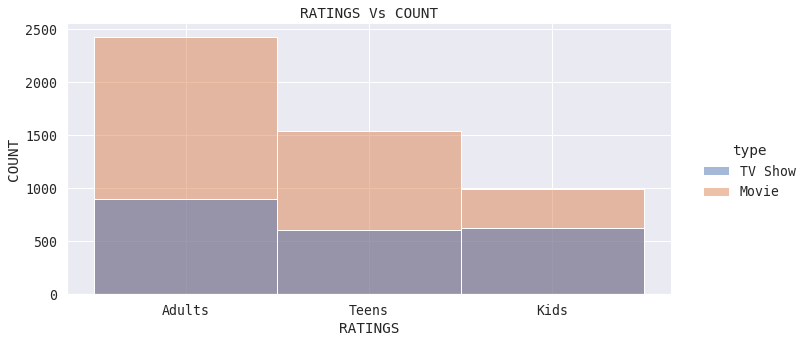

In [33]:
sns.displot(df,x='rating', hue ="type",height=5,  aspect=2 )
plt.title('RATINGS Vs COUNT')
plt.xlabel("RATINGS")
plt.ylabel("COUNT")

## Popular Actors 

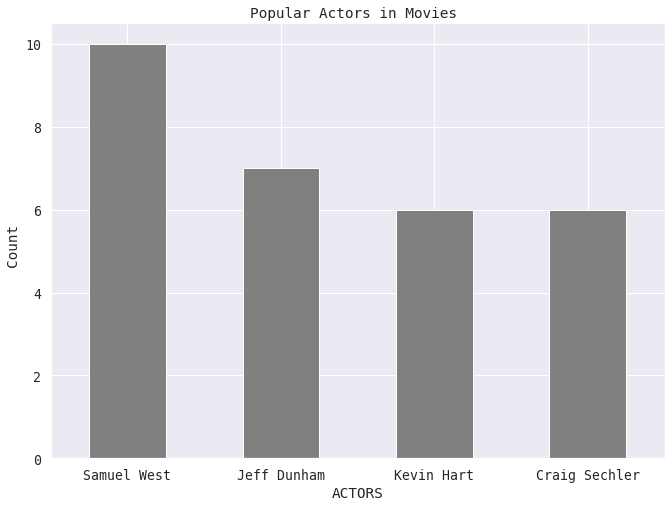

In [34]:
plt.figure(figsize = (11, 8))
df_movies.cast.value_counts().head(4).plot.bar(color = 'grey')
plt.xlabel("ACTORS")
plt.xticks(rotation =0)
plt.yticks([int(n) for n in range(0,12,2)])
plt.ylabel("Count ")
plt.title("Popular Actors in Movies " )
plt.show()

## Genre

- As there were more then one genre for a perticular content  , so i considered the first genre as the genre of content.
  for eg. for a particular content the genre was [ Dramas, International Movies] i replaced it with Drama .

In [35]:
df['genre'] = df['listed_in'].apply(lambda x: x.split(",")[0] )

In [36]:
plt.figure(figsize= (10 ,8))
genre = df.genre.value_counts() 
genre

Dramas                          1378
Comedies                        1068
Action & Adventure               715
International TV Shows           666
Children & Family Movies         475
Documentaries                    386
Kids' TV                         325
Stand-Up Comedy                  320
Crime TV Shows                   314
Horror Movies                    244
British TV Shows                 192
Anime Series                     145
International Movies             113
TV Comedies                      110
Docuseries                       100
Reality TV                        70
Classic Movies                    69
TV Dramas                         62
Movies                            52
Thrillers                         49
TV Action & Adventure             36
Stand-Up Comedy & Talk Shows      28
Romantic TV Shows                 28
Classic & Cult TV                 21
Independent Movies                20
Anime Features                    18
Music & Musicals                  17
C

<Figure size 720x576 with 0 Axes>

<AxesSubplot:title={'center':'TOP 5 GENRES'}, ylabel='genre'>

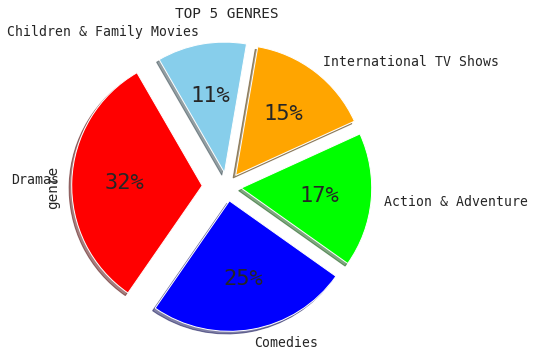

In [37]:
explode = [0.19, 0.11, 0.11, 0.11, 0.11]
colors = ['red' , 'blue' , 'lime','orange' ,'skyblue']

df.genre.value_counts()[:5].plot(kind='pie',figsize=(6,6),title = "TOP 5 GENRES"  , autopct='%.0f%%', shadow = True,startangle = 120,colors = colors, explode = explode  )

In [38]:
fig = px.treemap(df, path=['type', 'genre', 'rating', 'title' ],   color='genre')
fig.show()

In [39]:
# fig = px.treemap(df, path=['type', 'genre'],   color='genre')
# fig.show()

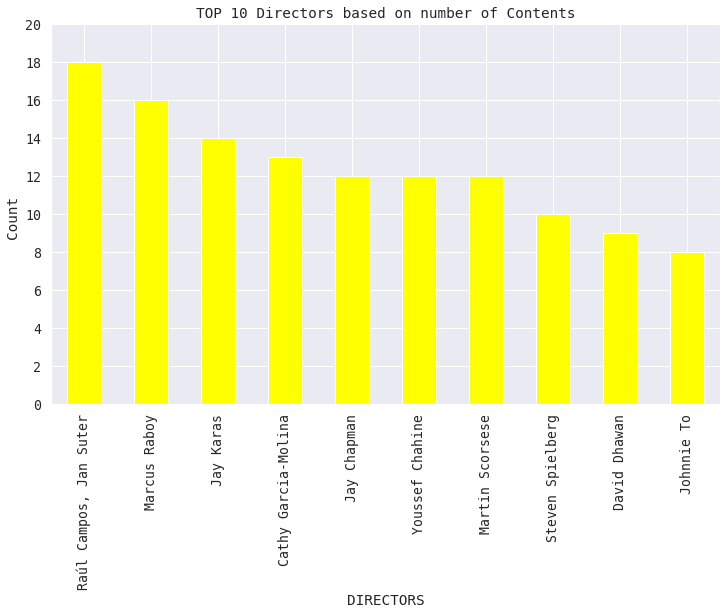

Raúl Campos, Jan Suter    18
Marcus Raboy              16
Jay Karas                 14
Cathy Garcia-Molina       13
Jay Chapman               12
Youssef Chahine           12
Martin Scorsese           12
Steven Spielberg          10
David Dhawan               9
Johnnie To                 8
Name: director, dtype: int64

In [40]:
dir = df.director.value_counts()[1:11]
dir.plot(kind='bar',figsize=(12,7), title= "TOP 10 Directors based on number of Contents" , color = 'yellow')
plt.ylabel("Count ")
plt.xlabel("DIRECTORS")
plt.yticks([int(n) for n in range(0,22,2)] )
plt.show()
dir


In [41]:
df.columns

Index(['index', 'show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'listed_in', 'year_added',
       'genre'],
      dtype='object')

## GENRES AND RATINGS
- I tried to make some interactive dashboards.

In [42]:
fig = px.density_heatmap(df, x="genre", y="rating", marginal_x="rug", marginal_y="histogram" )
plt.figure(figsize= (16,10))
fig.show()

<Figure size 1152x720 with 0 Axes>

In [43]:
fig = px.parallel_categories(df,dimensions=['type', 'rating'])
fig.show()

---
<a name = Section9></a>
## Summarization & Conclusion
---

- Netflix consist of 70% Movies And 30% Tv Shows.
- It Has Content Form Year 1942 to 2021.
- United States is at the top for both Movies and Tv Shows .
- India is second in terms of number of movies followed by UK & Canada.
- United Kingdom is second  for tv shows followed by Japan & South Korea 
- Production of tv shows has greatly increased from year 2000
- The rating TV-MA has most of the content .
- There is more content for adults .
- Samuel West is the most popular actor in movies 
- Drama is the most popular genre in movies
- comedy and action & adventure are some of the popular genre in movies.
- International Tv Shows is the most popular genre in tv shows . 
- Kids Tv Shows , Anime Series , Crime Tv Shows are some of the popular genre in tv shows .
- Raúl Campos, Jan Suter  is the top director in terms of number of content directed .
- we can get much more information containing small details about number of content,country , ratings by the interactive dashboards 
